# IMA208 -- TP1 Motion Estimation

```yaml
Name: Shujian YANG, Liyao JIAO
Date: Feb 15, 2024
```

This practical work, on motion estimation, has 2 different parts, corresponding to two families of algorithms that we have seen in class:
- Block matching algorithms
- Optic flow

You are asked to complete the different algorithms and to try it. Also, please answer to the theoretical questions, in the notebook.

In [3]:
import numpy as np
from scipy.io import loadmat
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import gaussian_filter
from scipy.interpolate import griddata
from scipy.signal import convolve2d

In [4]:
### useful functions
def initVector(ref,cur):
    """
    Performs an initialization for the first regularizers

    Parameters
    ----------
    ref : np.array
        Reference image.
    cur : np.array
        Current image.

    Returns
    -------
    pV : np.array (vector of size 2)
        Regularizer for displacement.

    """
    
    
    step = 8
    cont = 4*step
    
    REF = gaussian_filter(ref,1.) # Unclear how to set sigma # <- Why unclear?
    CUR = gaussian_filter(cur,1.)
    
    CUR = CUR[cont+1:(np.shape(CUR)[0]-cont):step,cont+1:(np.shape(CUR)[1]-cont):step]
    SSDMIN = np.inf
    
    pV=np.zeros(2)
    
    for globR in range(-cont,cont):
        for globC in range(-cont,cont):
            RR = REF[cont+1-globR:(cont-globR+np.shape(CUR)[0]*step):step, cont+1-globC:(cont-globC+np.shape(CUR)[1]*step):step]
            SSD = np.sum((RR-CUR)**2)
            
            if SSD<SSDMIN:
                SSDMIN=SSD
                pV[0]=globR
                pV[1]=globC
                
                
    return pV



def computePredictor(r,c,brow,bcol,mvf,ref,cur):
    """
    compute predictor gives the median of the mvf of the blocks :
        - to the left of the current block
        - above the current block
        - upper left of the current block
        
    If such blocks do not exist due to the border effects, they are not taken into account.

    Parameters
    ----------
    See usage in the me_ssd function

    Returns
    -------
    pV : Median of the mvf of the neighboor blocks

    """
    if r < brow and c < bcol:
        pV = initVector(ref,cur)
        
    elif r < brow: # First row
        pV = mvf[r,c-bcol,:]
        
    elif c < bcol: # First column
        pV = mvf[r-brow,c,:]
        
    else: # Inside
        if c >= np.shape(mvf)[1]-bcol: # Last column
            vC = mvf[r-brow,c-bcol,:]
        
        else: # Not the last column
            vC = mvf[r-brow,c+bcol,:]
            
        vA = mvf[r,c-bcol,:]
        vB = mvf[r-brow,c,:]

        temp = np.array([vA, vB, vC]).T

        pV = np.median(temp,axis = 1)
        
    pV = pV.ravel()
    
    return pV


def displayMVF(I,mvf,subsamp):
    
    row,col = np.shape(I)
    
    # Subsample dense MVF 
    vectRow = mvf[0:row:subsamp,0:col:subsamp,0]
    vectCol = mvf[0:row:subsamp,0:col:subsamp,1]
    
    # Determine vector origins
    X,Y = np.meshgrid(np.arange(0,col,subsamp),np.arange(0,row,subsamp))
    X = X + np.floor(subsamp/2.)
    Y = Y + np.floor(subsamp/2.)
    
    # Show image
    plt.figure()
    plt.imshow(I, cmap='gray', vmin=0, vmax=255)

    plt.quiver(X, Y, vectCol,-vectRow)

    return plt.gcf()

def pretty_displayMVF(I,mvf,subsamp, ax):
    
    row,col = np.shape(I)
    
    # Subsample dense MVF 
    vectRow = mvf[0:row:subsamp,0:col:subsamp,0]
    vectCol = mvf[0:row:subsamp,0:col:subsamp,1]
    
    # Determine vector origins
    X,Y = np.meshgrid(np.arange(0,col,subsamp),np.arange(0,row,subsamp))
    X = X + np.floor(subsamp/2.)
    Y = Y + np.floor(subsamp/2.)
    
    ax.imshow(I, cmap='gray', vmin=0, vmax=255)
    ax.quiver(X, Y, vectCol,-vectRow)

    return ax


def fracMc(ref,mvf,outofbound=20):
    
    [rows, cols] = np.shape(ref);
    
    
    
    mc_c, mc_r = np.meshgrid(np.arange(cols),np.arange(rows)) # Initial coordinates, used to infer the new coordinates
    
    mc_r_tmp = mc_r + mvf[:,:,0] # Row coordinates, after the movement
    mc_c_tmp = mc_c + mvf[:,:,1] # Column coordinates, after the movement
    
    extension = outofbound
    #ref = cv2.copyMakeBorder(ref, extension, extension, extension, extension, cv2.BORDER_REPLICATE)# Padded image
    ref = cv2.copyMakeBorder(ref, extension, extension, extension, extension, cv2.BORDER_REFLECT)# Padded image
    
    mc_r = mc_r_tmp + extension # Row coordinates, after the movement, in which we want to do the interpolation (in the padded image)
    mc_c = mc_c_tmp + extension # Column coordinates, after the movement, in which we want to do the interpolation (in the padded image)
    
    colMeshGrid, rowMeshGrid = np.meshgrid(np.arange(cols+2*extension),np.arange(rows+2*extension)) # Original coordinates, at which we know the data points
    
    
    # Put the input coordinates into the form of an array, to mach scipy format
    points = np.zeros((np.shape(ref)[0]*np.shape(ref)[1],2))
    points[:,0] = colMeshGrid.reshape(np.shape(ref)[0]*np.shape(ref)[1])
    points[:,1] = rowMeshGrid.reshape(np.shape(ref)[0]*np.shape(ref)[1])
    
    values = ref.reshape(np.shape(ref)[0]*np.shape(ref)[1])    
    
    
    # Put the coordinates in which we want ot do the interpolation into the form of an array, to mach scipy format
    points_inter = np.zeros((rows*cols,2))
    points_inter[:,0] = mc_c.reshape(rows*cols)
    points_inter[:,1] = mc_r.reshape(rows*cols)
    
    motcomp =  griddata(points, values, points_inter,'linear')
    
    motcomp = motcomp.reshape(rows,cols)

    return motcomp


def PSNR(im1,im2):
    """
    Computes the PSNR between im1 and im2. The two images must have the same size.

    Parameters
    ----------
    im1, im2 : nparray
        Two images.

    Returns
    -------
    psnr : float
    """
    mse = np.mean((im1 - im2)**2)
    max_value = 255
    return 10 * np.log10(max_value**2 / mse)


# I - Block matching algorithms
## I-1 - Unregularized algorithms
### I-1-a - Unregularized SSD-based algorithm

First, read the two images 'flower_cif_1.mat' and 'flower_cif_1.mat', which are two consecutive frames of a video sequence. You will have to estimate the motion between these frame, using block matching algorithms.

In [5]:
im1 = loadmat('flower_cif_1.mat')['im1']
im1 = im1.astype('float')
im2 = loadmat('flower_cif_2.mat')['im2']
im2 = im2.astype('float')

In [6]:
psnr = PSNR(im1, im2)
mse = np.mean((im1 - im2) ** 2)

Text(0.5, 0.98, 'MSE = 859.86, PSNR = 18.79')

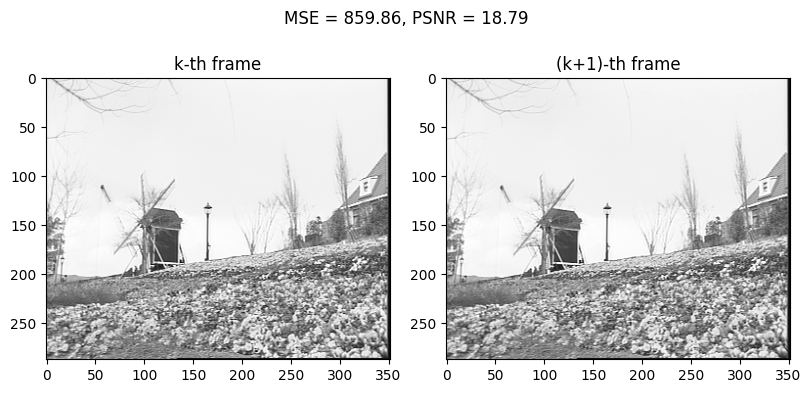

In [8]:
fig, axs = plt.subplots(1,2, figsize=(8, 4), constrained_layout=True)
axs[0].imshow(im1, vmin=0, vmax=255, cmap="gray")
axs[0].set_title("k-th frame")
axs[1].imshow(im2, vmin=0, vmax=255, cmap="gray")
axs[1].set_title("(k+1)-th frame")
plt.suptitle(f"MSE = {mse:.2f}, PSNR = {psnr:.2f}")

Second, you will have to encode a block matching using the SSD criterion. Some default values of the algorithm are given below: the number of column and rows in each block, and the search radius.

In [5]:
brow = 16 # Number of rows per block
bcol = 16 # Number of columns per block
search_radius = 8 # Search radius

Fill the me_ssd function in the cell below. First, implement the unregularized part of the function (you will implement the regularized one later). Do not pay attention to the computePredictor and initVector (we will speak about them later on).

## `me_ssd` and `me_sad` 

In [9]:
def me_ssd(cur, ref, brow, bcol, search, lamb=0):

    ref_extended = cv2.copyMakeBorder(ref, search, search, search, search, cv2.BORDER_REPLICATE) # To avoid border effect
    prediction = np.zeros_like(cur);
    mvf = np.zeros((*cur.shape,2))
    

    if lamb == 0:
        for r in range(0, cur.shape[0], brow):
            for c in range(0, cur.shape[1], bcol):
                # current block
                B = cur[r:r+brow, c:c+bcol]

                # Init
                costMin = np.inf
                Rbest = None
                Vbest = None

                for drow in range(-search, search + 1):
                    for dcol in range(-search, search + 1):
                        B_ref = ref_extended[
                            search+r+drow : search+r+drow+B.shape[0],
                            search+c+dcol : search+c+dcol+B.shape[1],
                        ]

                        cost = np.mean((B - B_ref) ** 2) # MSE 

                        if cost < costMin:
                            Rbest = B_ref
                            Vbest = (drow, dcol)
                            costMin = cost
                
                mvf[r : r+brow, c : c+bcol, 0] = np.ones((brow, bcol)) * Vbest[0] # Once the loop is over, save the best row displacement field
                mvf[r : r+brow, c : c+bcol, 1] = np.ones((brow, bcol)) * Vbest[1] # Once the loop is over, save the best column displacement field
                prediction[r:r+brow,c:c+bcol] = Rbest
    
    else:
        for r in range(0, cur.shape[0], brow):
            for c in range(0, cur.shape[1], bcol):
                # current block
                B = cur[r:r+brow, c:c+bcol]

                # Init
                costMin = np.inf
                Rbest = None
                Vbest = None

                # Neighbours : pV is the regularization vector. The regularizer must be such that the estimated displacement is not too far away from pV
                pV = computePredictor(r,c,brow,bcol,mvf,ref,cur)

                for drow in range(-search, search + 1):
                    for dcol in range(-search, search + 1):
                        B_ref = ref_extended[
                            search+r+drow : search+r+drow+B.shape[0],
                            search+c+dcol : search+c+dcol+B.shape[1],
                        ]

                        lamb_area = lamb * B.shape[0] * B.shape[1]

                        cost = np.mean((B - B_ref) ** 2) + lamb_area * np.sum((np.array([drow, dcol]) - pV) ** 2)

                        if cost < costMin:
                            Rbest = B_ref
                            Vbest = (drow, dcol)
                            costMin = cost
                
                mvf[r : r+brow, c : c+bcol, 0] = np.ones((brow, bcol)) * Vbest[0] # Once the loop is over, save the best row displacement field
                mvf[r : r+brow, c : c+bcol, 1] = np.ones((brow, bcol)) * Vbest[1] # Once the loop is over, save the best column displacement field
                prediction[r:r+brow,c:c+bcol] = Rbest

    return -mvf, prediction

In [10]:
def me_sad(cur, ref, brow, bcol, search, lamb=0):

    ref_extended = cv2.copyMakeBorder(ref, search, search, search, search, cv2.BORDER_REPLICATE) # To avoid border effect
    prediction = np.zeros_like(cur);
    mvf = np.zeros((*cur.shape,2))
    
    if lamb == 0:
        for r in range(0, cur.shape[0], brow):
            for c in range(0, cur.shape[1], bcol):
                # current block
                B = cur[r:r+brow, c:c+bcol]

                # Init
                costMin = np.inf
                Rbest = None
                Vbest = None

                for drow in range(-search, search + 1):
                    for dcol in range(-search, search + 1):
                        B_ref = ref_extended[
                            search+r+drow : search+r+drow+B.shape[0],
                            search+c+dcol : search+c+dcol+B.shape[1],
                        ]

                        cost = np.mean(np.abs(B - B_ref)) # MAD

                        if cost < costMin:
                            Rbest = B_ref
                            Vbest = (drow, dcol)
                            costMin = cost
                
                mvf[r : r+brow, c : c+bcol, 0] = np.ones((brow, bcol)) * Vbest[0] # Once the loop is over, save the best row displacement field
                mvf[r : r+brow, c : c+bcol, 1] = np.ones((brow, bcol)) * Vbest[1] # Once the loop is over, save the best column displacement field
                prediction[r:r+brow,c:c+bcol] = Rbest
    
    else:
        for r in range(0, cur.shape[0], brow):
            for c in range(0, cur.shape[1], bcol):
                # current block
                B = cur[r:r+brow, c:c+bcol]

                # Init
                costMin = np.inf
                Rbest = None
                Vbest = None

                # Neighbours : pV is the regularization vector. The regularizer must be such that the estimated displacement is not too far away from pV
                pV = computePredictor(r,c,brow,bcol,mvf,ref,cur)

                for drow in range(-search, search + 1):
                    for dcol in range(-search, search + 1):
                        B_ref = ref_extended[
                            search+r+drow : search+r+drow+B.shape[0],
                            search+c+dcol : search+c+dcol+B.shape[1],
                        ]

                        lamb_area = lamb * B.shape[0] * B.shape[1]
                        
                        cost = np.mean(np.abs(B - B_ref)) \
                            + lamb_area * np.sum((np.array([drow, dcol]) - pV) ** 2)

                        if cost < costMin:
                            Rbest = B_ref
                            Vbest = (drow, dcol)
                            costMin = cost
                
                mvf[r : r+brow, c : c+bcol, 0] = np.ones((brow, bcol)) * Vbest[0] # Once the loop is over, save the best row displacement field
                mvf[r : r+brow, c : c+bcol, 1] = np.ones((brow, bcol)) * Vbest[1] # Once the loop is over, save the best column displacement field
                prediction[r:r+brow,c:c+bcol] = Rbest

    return -mvf, prediction

---

Text(0.5, 0.98, 'Figure01: Test block_size by ssd')

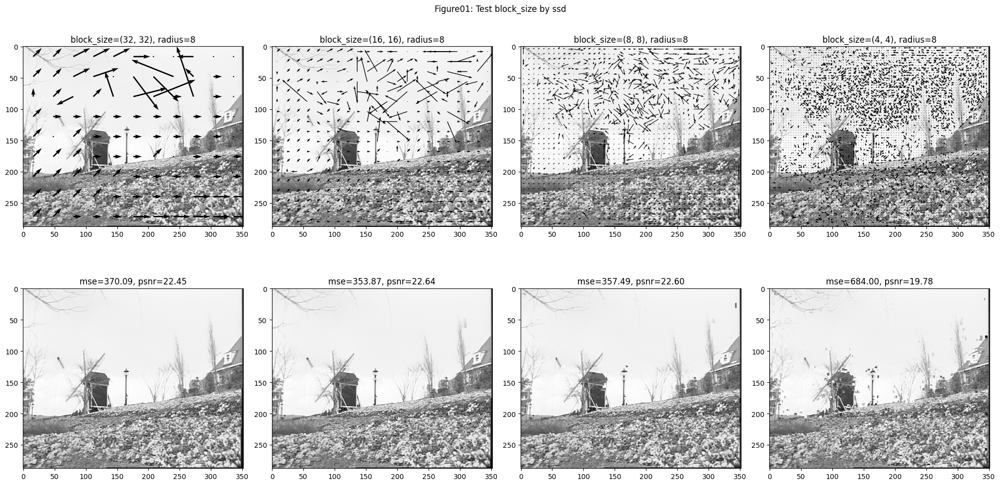

In [24]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10), constrained_layout=True)
axsf = axs.flatten()

for i, (brow, search_radius) in enumerate([
    (32, 8), (16, 8), (8, 8), (4, 8)
]):
    ax = axs[0][i]
    bcol = brow
    mvf_ssd,prediction =  me_ssd(im1, im2, brow, bcol, search_radius)
    
    pretty_displayMVF(im1, mvf_ssd, brow, ax)
    ax.set_title(f"block_size=({brow}, {bcol}), radius={search_radius}")
    mc_ssd = fracMc(im1, mvf_ssd)
    mse = np.mean((mc_ssd - im2) ** 2)
    psnr = PSNR(mc_ssd, im2)

    ax = axs[1][i]
    ax.imshow(mc_ssd, vmin=0, vmax=255, cmap="grey")
    ax.set_title(f"mse={mse:.2f}, psnr={psnr:.2f}")


plt.suptitle("Figure01: Test block_size by ssd")

### <span style="color:blue; font-weight:bold;">Q01 :</span>: Using the function displayMVF, show the motion vector field. Write your remarks. Are there errors? If yes, where and why?

<span style="color:blue; font-weight:bold;">A01 :</span>
We find two errors in Figure01, the images on the first line:

1. The motion vector doesn't maintain continuity for block size = 16, search radius = 8 without regularization. The error is caused by the "similarity" of the background.

2. In this code:
    ```python
        mvf_ssd,prediction =  me_ssd(im2, im1, brow, bcol, search_radius)
        displayMVF(im1,mvf_ssd,brow)
    ```
    We obtain the motion vector field (MVF) from im2 to im1, but we visualize the MVF on im1, which seems incorrect. Therefore, in the subsequent cells, we modify the originally provided code to `me_ssd(im1, im2, brow, bcol, search_radius)`. This adjustment signifies that the MVF is from im1 to im2 from now on.

### <span style="color:blue; font-weight:bold;">Q02 :</span>: Change the block size and the search area radius. How does it impact your results?

<span style="color:blue; font-weight:bold;">A02 :</span>

- In Figure01, we compare the results of different block sizes. A large block size will result in a lower resolution motion vector field (MVF), while a small block size will require more computational resources. Additionally, a medium block size will help us achieve the best peak signal-to-noise ratio (PSNR).

- In Figure02, we test the impact of search radius, which limits the maximum motion vector. This parameter actually plays a similar role to regularization.

Text(0.5, 0.98, 'Figure02: Test search_radius by ssd')

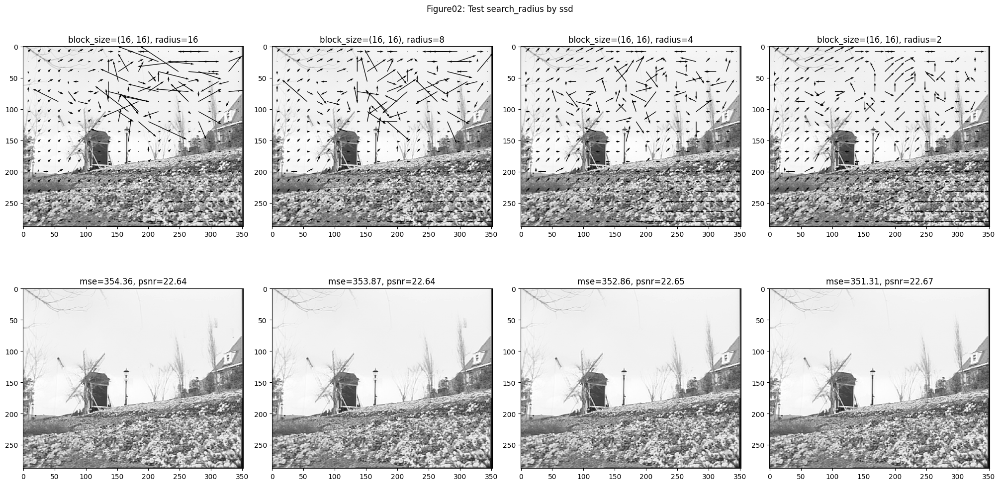

In [25]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10), constrained_layout=True)
axsf = axs.flatten()

for i, (brow, search_radius) in enumerate([
    (16, 16), (16, 8), (16, 4), (16, 2)
]):
    ax = axs[0][i]
    bcol = brow
    mvf_ssd,prediction =  me_ssd(im1, im2, brow, bcol, search_radius)
    
    pretty_displayMVF(im1, mvf_ssd, brow, ax)
    ax.set_title(f"block_size=({brow}, {bcol}), radius={search_radius}")
    mc_ssd = fracMc(im1, mvf_ssd)
    mse = np.mean((mc_ssd - im2) ** 2)
    psnr = PSNR(mc_ssd, im2)

    ax = axs[1][i]
    ax.imshow(mc_ssd, vmin=0, vmax=255, cmap="grey")
    ax.set_title(f"mse={mse:.2f}, psnr={psnr:.2f}")


plt.suptitle("Figure02: Test search_radius by ssd")



---

### <span style="color:blue; font-weight:bold;">Q03 :</span>: Display the motion compensated image. What can you observe ?

<span style="color:blue; font-weight:bold;">A03 :</span> In Figure01 and Figure02, we can observe the motion-compensated images, although deducing solely by visual observation is not feasible. However, by comparing the PSNR between im1-im2 PSNR(18) and between im2-mc_ssd PSNR(22), we can infer that the compensated images are superior.

### <span style="color:blue; font-weight:bold;">Q04 :</span>: Is the PSNR between the motion-compensated image and im2 better than between im1 and im2 ? Explain why.

<span style="color:blue; font-weight:bold;">A04 :</span> 
- Yes, because the algorithm works.


---

### I-1-b Unregularized SAD-based algorithm
Now, we will use the SAD as a metric for the block matching algorithm. To do that, implement the unregularized part of the me_sad algorithm. Please note that you function should be very similar to me_ssd, except for the metric (as such, as a starting point, you can copy paste what you have proposed for me_ssd).

Text(0.5, 0.98, 'Figure03: Test block_size by sad')

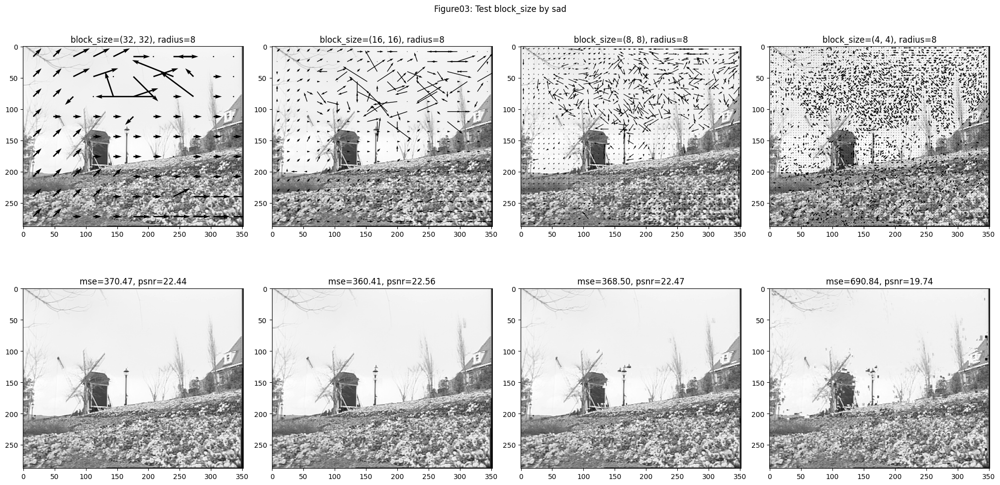

In [28]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10), constrained_layout=True)
axsf = axs.flatten()

for i, (brow, search_radius) in enumerate([
    (32, 8), (16, 8), (8, 8), (4, 8)
]):
    ax = axs[0][i]
    bcol = brow
    mvf_sad,prediction =  me_sad(im1, im2, brow, bcol, search_radius)
    
    pretty_displayMVF(im1, mvf_sad, brow, ax)
    ax.set_title(f"block_size=({brow}, {bcol}), radius={search_radius}")
    mc_sad = fracMc(im1, mvf_sad)
    mse = np.mean((mc_sad - im2) ** 2)
    psnr = PSNR(mc_sad, im2)

    ax = axs[1][i]
    ax.imshow(mc_sad, vmin=0, vmax=255, cmap="grey")
    ax.set_title(f"mse={mse:.2f}, psnr={psnr:.2f}")


plt.suptitle("Figure03: Test block_size by sad")

Text(0.5, 0.98, 'Figure04: Test search_radius by sad')

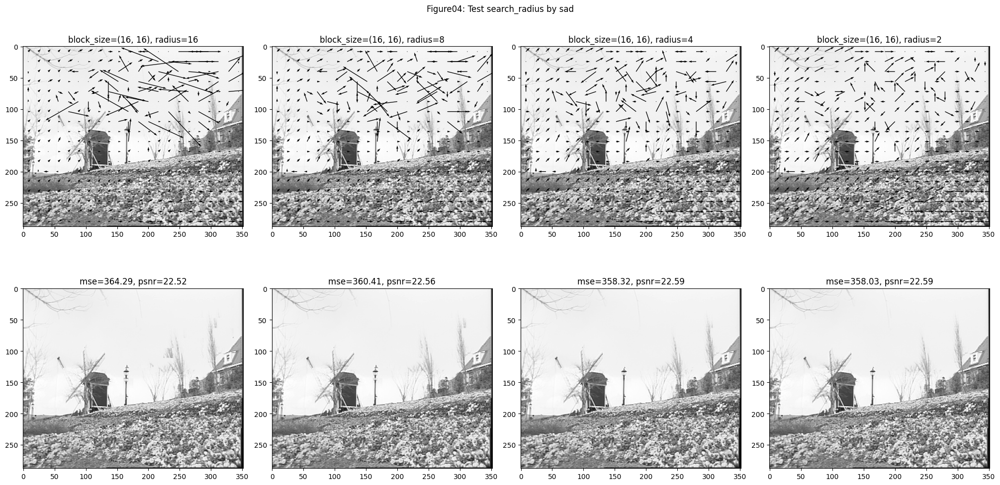

In [29]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10), constrained_layout=True)
axsf = axs.flatten()

for i, (brow, search_radius) in enumerate([
    (16, 16), (16, 8), (16, 4), (16, 2)
]):
    ax = axs[0][i]
    bcol = brow
    mvf_sad,prediction =  me_sad(im1, im2, brow, bcol, search_radius)
    
    pretty_displayMVF(im1, mvf_sad, brow, ax)
    ax.set_title(f"block_size=({brow}, {bcol}), radius={search_radius}")
    mc_sad = fracMc(im1, mvf_sad)
    mse = np.mean((mc_sad - im2) ** 2)
    psnr = PSNR(mc_sad, im2)

    ax = axs[1][i]
    ax.imshow(mc_sad, vmin=0, vmax=255, cmap="grey")
    ax.set_title(f"mse={mse:.2f}, psnr={psnr:.2f}")


plt.suptitle("Figure04: Test search_radius by sad")



### <span style="color:blue; font-weight:bold;">Q05 :</span>: Show the motion vector field using the displayMVF function. Do you see any difference with the SSD ? Explain.

<span style="color:blue; font-weight:bold;">A05 :</span> 

By comparing Figure 01 and 03, Figure 02 and 04,  we find the ssd method got better psnr than sad. 

---


## I-2- Regularized algorithms
Now, we will add a regularization term to the metrics (SSD and then SAD) we previously used.
### I-2-1- Regularized SSD-based algorithm

TO DO : code the regularized SSD-based algorithm.
For the sake of simplicity, the regularizing function is already given. How does it work and what does it compute?

Try several parameter values, and compare your results with the unregularized algorithms. What can you observe?

### I-2-2- Regularized SAD-based algorithm

TO DO : code the regularized SAD-based algorithm.

Try several parameter values, and compare your results with the unregularized algorithms and the regularized SSD-based algorithm.

Text(0.5, 0.98, 'Figure05: Test lambs by ssd with block=((16, 16)), sr=8')

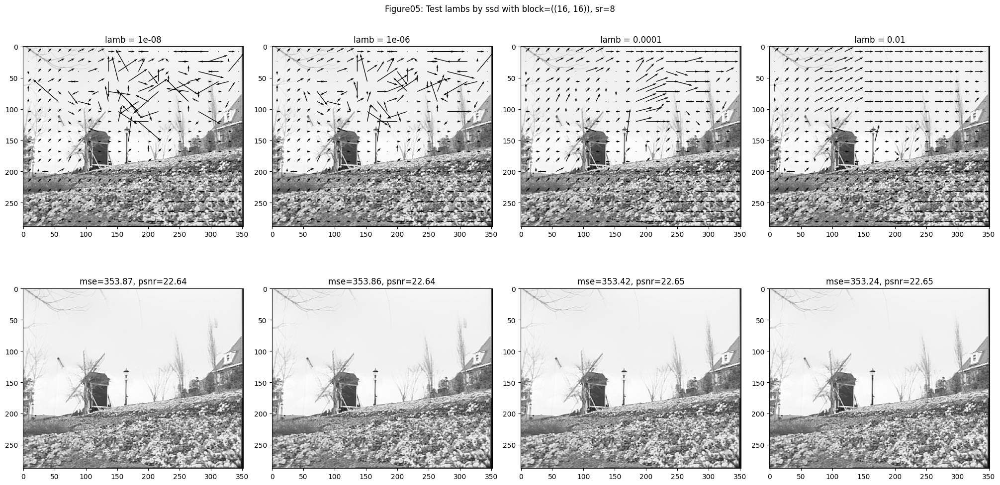

In [31]:
brow = 16
bcol = 16
search_radius = 8


fig, axs = plt.subplots(2, 4, figsize=(20, 10), constrained_layout=True)
axsf = axs.flatten()

for i, lamb in enumerate(range(-8, 0, 2)):
    lamb = 10**lamb
    ax = axs[0][i]
    mvf_ssd, prediction =  me_ssd(im1, im2, brow, bcol, search_radius, lamb=lamb)
    pretty_displayMVF(im1, mvf_ssd, brow, ax)
    ax.set_title(f"lamb = {lamb}")
    mc_ssd = fracMc(im1, mvf_ssd)
    mse = np.mean((mc_ssd - im2) ** 2)
    psnr = PSNR(mc_ssd, im2)

    ax = axs[1][i]
    ax.imshow(mc_ssd, vmin=0, vmax=255, cmap="grey")
    ax.set_title(f"mse={mse:.2f}, psnr={psnr:.2f}")


plt.suptitle(f"Figure05: Test lambs by ssd with block=({brow, bcol}), sr={search_radius}")



Text(0.5, 0.98, 'Figure06: Test lambs by sad with block=((16, 16)), sr=8')

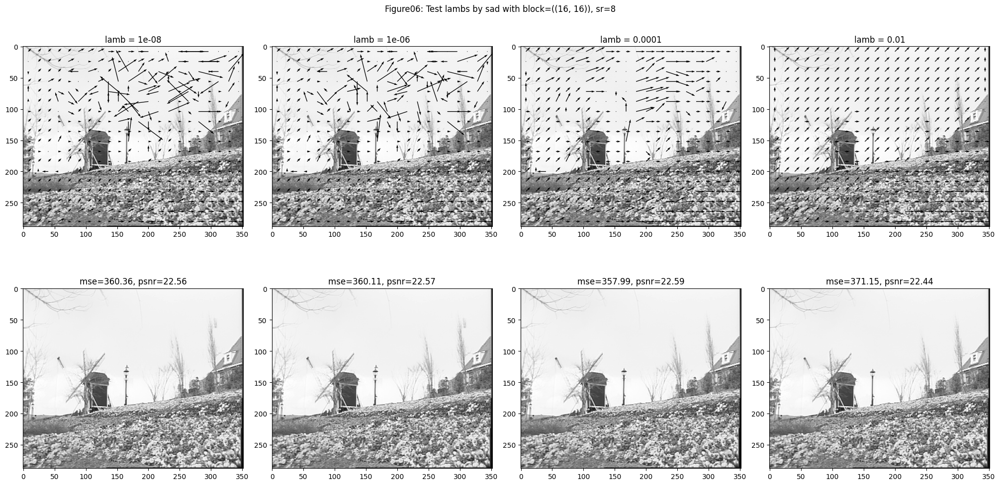

In [33]:
brow = 16
bcol = 16
search_radius = 8


fig, axs = plt.subplots(2, 4, figsize=(20, 10), constrained_layout=True)
axsf = axs.flatten()

for i, lamb in enumerate(range(-8, 0, 2)):
    lamb = 10**lamb
    ax = axs[0][i]
    mvf_sad, prediction =  me_sad(im1, im2, brow, bcol, search_radius, lamb=lamb)
    pretty_displayMVF(im1, mvf_sad, brow, ax)
    ax.set_title(f"lamb = {lamb}")
    mc_sad = fracMc(im1, mvf_sad)
    mse = np.mean((mc_sad - im2) ** 2)
    psnr = PSNR(mc_sad, im2)

    ax = axs[1][i]
    ax.imshow(mc_sad, vmin=0, vmax=255, cmap="grey")
    ax.set_title(f"mse={mse:.2f}, psnr={psnr:.2f}")


plt.suptitle(f"Figure06: Test lambs by sad with block=({brow, bcol}), sr={search_radius}")



#### <span style="color:blue; font-weight:bold;">Answer regularized algorithms :</span> 


- Figure 05 and 06 respectively test the regularized results. We found that using an appropriate lambda value, the motion vector field (MVF) will show consistency. For example, with lambda = 0.1, the MVF is significantly improved.

- In the follow Figure 07, we found the max psnr is when $\lambda = 0.1$

---

In [36]:
lambs = np.array([10 ** x for x in range(-10, 2, 1)])
mses = []
psnrs = []

for i, lamb in enumerate(lambs):
    mvf_ssd, prediction =  me_ssd(im1, im2, brow, bcol, search_radius, lamb=lamb)
    mc_ssd = fracMc(im1, mvf_ssd)
    mse = np.mean((mc_ssd - im2) ** 2)
    psnr = PSNR(mc_ssd, im2)

    mses.append(mse)
    psnrs.append(psnr)

Text(0.5, 1.0, 'Figure 07: psnr & different $\\lambda$')

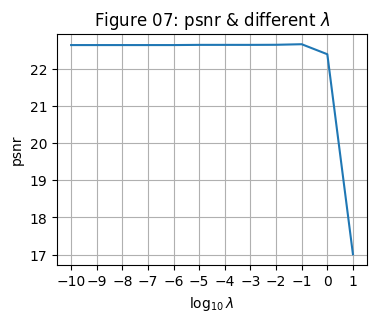

In [37]:
plt.figure(figsize=(4, 3))
plt.plot(np.log10(lambs), psnrs)
plt.xlabel("$\log_{10} \lambda$")
plt.ylabel("psnr")
plt.xticks(range(-10, 2))
plt.grid()
plt.title("Figure 07: psnr & different $\lambda$")

---
---

# Optical flow

You will now implement the Horn and Schunck algorithm to estimate the optic flow. The two images we will consider here have a more local movement vector field, since we are considering small movements in a face.

In [41]:
im1 = loadmat('akiyo_cif1.mat')['im1']
im1 = im1.astype('float')
im2 = loadmat('akiyo_cif2.mat')['im2']
im2 = im2.astype('float')

In [43]:
mse = np.mean((im1 - im2) ** 2)
psnr = PSNR(im1, im2)

Text(0.5, 0.98, 'MSE = 21.20, PNSR = 34.87')

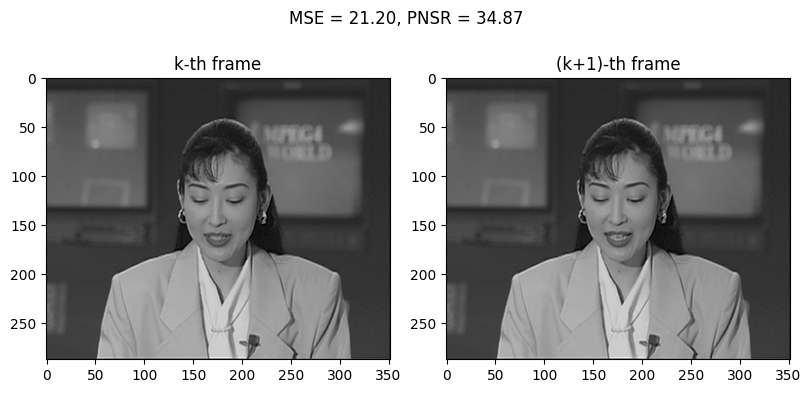

In [45]:
fig, axs = plt.subplots(1,2, figsize=(8, 4), constrained_layout=True)

axs[0].imshow(im1, vmin=0, vmax=255, cmap="gray")
axs[0].set_title("k-th frame")
axs[1].imshow(im2, vmin=0, vmax=255, cmap="gray")
axs[1].set_title("(k+1)-th frame")
plt.suptitle(f"MSE = {mse:.2f}, PNSR = {psnr:.2f}")

Compute the optical flow by filling the gaps in the Horn and Schunck function. You can use the motion field that you estimated before with the block matching algorithm to initialize the Horn and Schunck method.

As a reminder, the optical flow is implemented by the iterative Horn and Schunck's algorithm:
$$
u^{n+1} = \bar{u}^n - f_x \frac{\bar{u}^n f_x + \bar{v}^n f_y + f_t}{\alpha^2 + \|\nabla f\|^2}
$$
$$
v^{n+1} = \bar{v}^n - f_y \frac{\bar{u}^n f_x + \bar{v}^n f_y + f_t}{\alpha^2 + \|\nabla f\|^2}
$$
where $u^n$ is the value of the $u$ component at the $n$-th iteration, and $\bar{u}$ is the local average of $u$.

In [105]:
brow = 16; bcol=16; search_radius =13

mvf_ssd,prediction =  me_ssd(im1, im2, brow, bcol, search_radius, lamb=1e-1)
mc_ssd = fracMc(im1,mvf_ssd)
psnr_ssd = PSNR(im2, mc_ssd)
print(psnr_ssd)


Text(0.5, 0.98, 'Initialization by ssd, with psnr = 40.13')

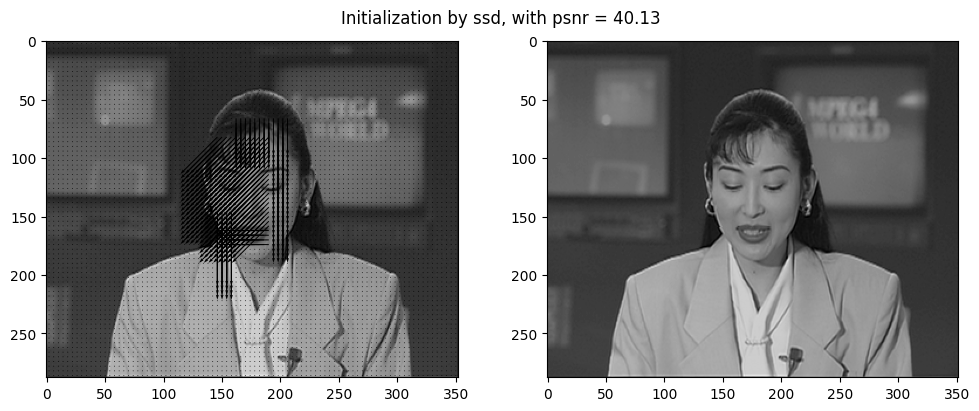

In [107]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4), constrained_layout=True)

axsf = axs.flatten()

ax = axsf[0]
pretty_displayMVF(im1, mvf_ssd, 4, ax)

ax = axsf[1]
ax.imshow(mc_ssd, vmin=0, vmax=255, cmap="gray")

plt.suptitle(f"Initialization by ssd, with psnr = {psnr_ssd:.2f}")


In [108]:
def computeDerivatives(im1, im2):
    kernel1D = np.expand_dims((1./12.)*np.array([-1., 8., 0., -8., 1.]),axis=1).T
    fx = convolve2d(im1,kernel1D,'same')
    fy = convolve2d(im1,kernel1D.T,'same')
    ft = convolve2d(im1, 0.25*np.ones((2,2)),'same') + convolve2d(im2, -0.25*np.ones((2,2)),'same');
    fx =-fx;
    fy=-fy;

    return fx, fy, ft


#%%
def HS(im1, im2, uInitial, vInitial, alpha=1, ite=100,blur = 1.):
    """
    Horn-Schunck optical flow method.
    Horn, B.K.P., and Schunck, B.G., Determining Optical Flow, AI(17), No. 1-3, August 1981, pp. 185-203 http://dspace.mit.edu/handle/1721.1/6337
    
    [u, v] = HS(im1, im2, alpha, ite, uInitial, vInitial, displayFlow)
    
    Parameters
    ----------
    im1, im2 : np.array
        Two subsequent frames or images.
    uInitial, vInitial: np.array
        Initial values for the (u,v) flow. If well initialized, the flow would converge faster and hence would need less iterations.
    alpha : scalar
        A parameter that reflects the influence of the smoothness term.
    ite : int
        Number of iterations.

    Returns
    -------
    u,v : np.array
        Optical flow.
    """
    
    im1 = gaussian_filter(im1,blur)
    im2 = gaussian_filter(im2,blur)
    
    # Set initial value for the flow vectors
    u = uInitial.copy()
    v = vInitial.copy()
    
    # Estimate spatiotemporal derivatives
    fx, fy, ft = computeDerivatives(im1, im2)

    # Averaging kernel
    kernel_1=np.array([[1./12., 1./6., 1./12.],[1./6., 0., 1./6.],[1./12., 1./6., 1./12.]])
    
    for i in range(ite):
        # Compute local averages of the flow vectors using kernel_1
        uAvg=convolve2d(u, kernel_1, 'same')
        vAvg=convolve2d(v, kernel_1, 'same')
        
        # Compute flow vectors constrained by its local average and the optical flow constraints
        # u = uAvg - fx*(uAvg * fx + vAvg * fy+  ft) / (alpha**2 + np.linalg.norm(fx+fy+ft)**2)
        # v = vAvg - fx*(uAvg * fx + vAvg * fy + ft) / (alpha**2 + np.linalg.norm(fx+fy+ft)**2)

        u = uAvg - fx*(uAvg * fx + vAvg * fy + ft) / (alpha**2 + (fx**2+fy**2+ft**2))
        v = vAvg - fy*(uAvg * fx + vAvg * fy + ft) / (alpha**2 + (fx**2+fy**2+ft**2))

    u[np.isnan(u)]= 0
    v[np.isnan(v)]= 0
    return u, v

In [116]:
alpha = 100
ite = 100

uInitial = mvf_ssd[..., 1] # Rem: pay attention to the inversion of the order compare to me_ssd.
vInitial = mvf_ssd[..., 0]
[u, v] = HS(im1, im2, uInitial, vInitial, alpha, ite,blur=1.)

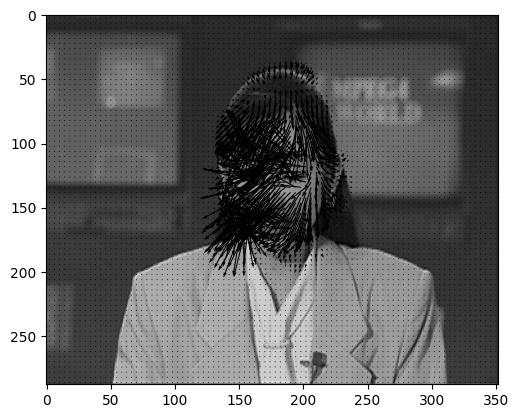

In [117]:
mvf_hs = np.zeros((np.shape(v)[0],np.shape(v)[1],2))
mvf_hs[:,:,0] = v
mvf_hs[:,:,1] = u
displayMVF(im1,mvf_hs,4)

mc_hs = fracMc(im1,mvf_hs)
psnr_hs = PSNR(im2,mc_hs)

Text(0.5, 1.0, 'mc_hs, psnr=34.01')

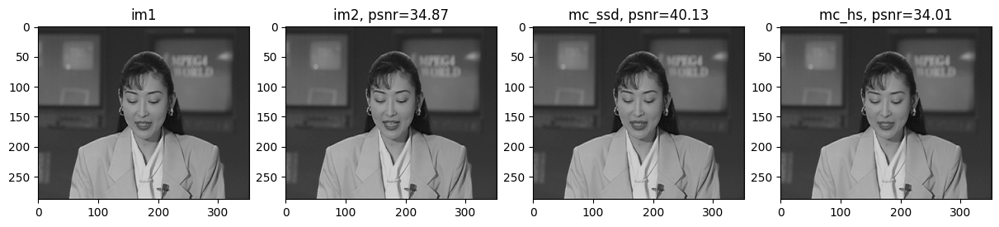

In [121]:
fig, axs = plt.subplots(1, 4, figsize=(12, 4), constrained_layout=True)

axsf = axs.flatten()

ax = axsf[0]
ax.imshow(im1, vmin=0, vmax=255, cmap="gray")
ax.set_title("im1")


ax = axsf[1]
ax.imshow(im2, vmin=0, vmax=255, cmap="gray")
ax.set_title(f"im2, psnr={PSNR(im2, im1):.2f}")


ax = axsf[2]
ax.imshow(mc_ssd, vmin=0, vmax=255, cmap="gray")
ax.set_title(f"mc_ssd, psnr={PSNR(im2, mc_ssd):.2f}")

ax = axsf[3]
ax.imshow(mc_hs, vmin=0, vmax=255, cmap="gray")
ax.set_title(f"mc_hs, psnr={PSNR(im2, mc_hs):.2f}")



In [124]:
im1 = loadmat('flower_cif_1.mat')['im1']
im1 = im1.astype('float')
im2 = loadmat('flower_cif_2.mat')['im2']
im2 = im2.astype('float')

mse = np.mean((im1 - im2) ** 2)
psnr = PSNR(im1, im2)
print(psnr)

18.786509322935075


Text(0.5, 0.98, 'MSE = 859.86, PNSR = 18.79')

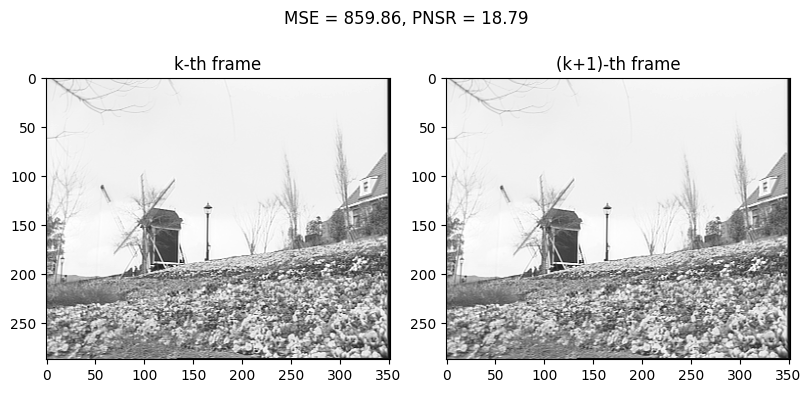

In [125]:
fig, axs = plt.subplots(1,2, figsize=(8, 4), constrained_layout=True)

axs[0].imshow(im1, vmin=0, vmax=255, cmap="gray")
axs[0].set_title("k-th frame")
axs[1].imshow(im2, vmin=0, vmax=255, cmap="gray")
axs[1].set_title("(k+1)-th frame")
plt.suptitle(f"MSE = {mse:.2f}, PNSR = {psnr:.2f}")

In [126]:
brow = 16; bcol=16; search_radius =13;

mvf_ssd,prediction =  me_ssd(im1, im2, brow, bcol, search_radius, lamb=1e-1)
mc_ssd = fracMc(im1,mvf_ssd)
psnr_ssd = PSNR(im2, mc_ssd)
print(psnr_ssd)


22.66524310105428


Text(0.5, 0.98, 'Initialization by ssd, with psnr = 22.67')

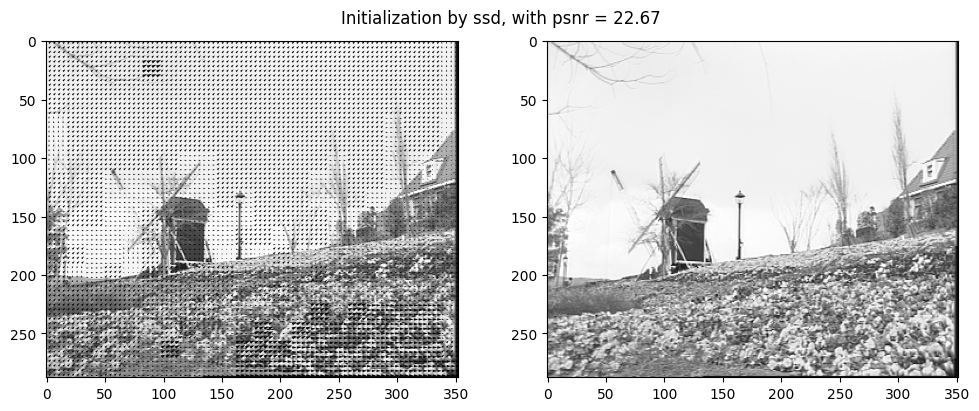

In [127]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4), constrained_layout=True)

axsf = axs.flatten()

ax = axsf[0]
pretty_displayMVF(im1, mvf_ssd, 4, ax)

ax = axsf[1]
ax.imshow(mc_ssd, vmin=0, vmax=255, cmap="gray")

plt.suptitle(f"Initialization by ssd, with psnr = {psnr_ssd:.2f}")


In [128]:
alpha = 100
ite = 100

uInitial = mvf_ssd[..., 1] # Rem: pay attention to the inversion of the order compare to me_ssd.
vInitial = mvf_ssd[..., 0]
[u, v] = HS(im1, im2, uInitial, vInitial, alpha, ite,blur=1.)

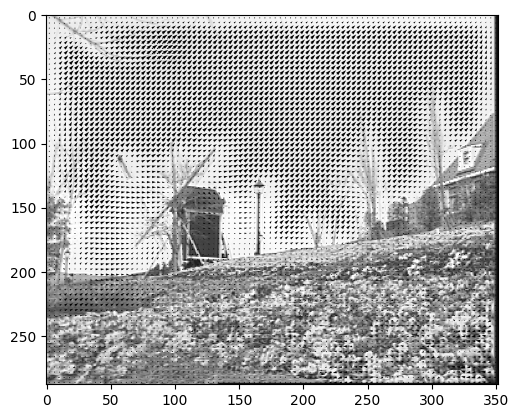

In [129]:
mvf_hs = np.zeros((np.shape(v)[0],np.shape(v)[1],2))
mvf_hs[:,:,0] = v
mvf_hs[:,:,1] = u
displayMVF(im1,mvf_hs,4)

mc_hs = fracMc(im1,mvf_hs)
psnr_hs = PSNR(im2,mc_hs)

Text(0.5, 1.0, 'mc_hs, psnr=18.51')

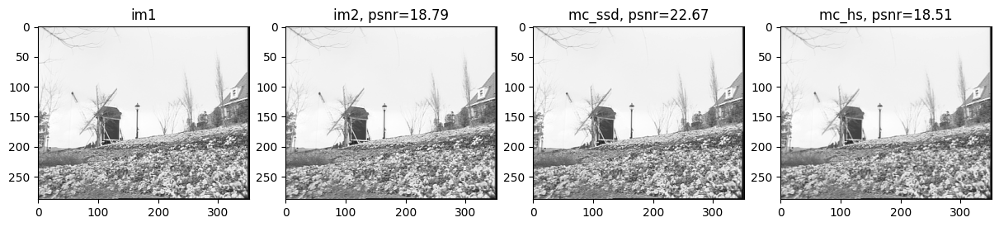

In [130]:
fig, axs = plt.subplots(1, 4, figsize=(12, 4), constrained_layout=True)

axsf = axs.flatten()

ax = axsf[0]
ax.imshow(im1, vmin=0, vmax=255, cmap="gray")
ax.set_title("im1")


ax = axsf[1]
ax.imshow(im2, vmin=0, vmax=255, cmap="gray")
ax.set_title(f"im2, psnr={PSNR(im2, im1):.2f}")


ax = axsf[2]
ax.imshow(mc_ssd, vmin=0, vmax=255, cmap="gray")
ax.set_title(f"mc_ssd, psnr={PSNR(im2, mc_ssd):.2f}")

ax = axsf[3]
ax.imshow(mc_hs, vmin=0, vmax=255, cmap="gray")
ax.set_title(f"mc_hs, psnr={PSNR(im2, mc_hs):.2f}")



### <span style="color:blue; font-weight:bold;">Q06 :</span>: Display the motion field and compute the PSNR. Do you observe any improvement compare to block-matching algorithms? Explain. You can test on both the Akiyo and Flowers images.

<span style="color:blue; font-weight:bold;">A06 :</span>

We found that the ssd method is better than HS method.

---
---
---